In [1]:
# The folder where the script is saved will be your working directory

In [2]:
import numpy as np  # similiar to library() but with 'as' you shorten its commands
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import bbknn
from pandas.core.index import RangeIndex

In [3]:
sc.settings.verbosity = 3   # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()  # Logging version number is important to keep track of for research purposes
sc.settings.set_figure_params(dpi=80)

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.10 numpy==1.17.2 scipy==1.2.2 pandas==0.25.1 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [4]:
adata1 = sc.read_loom(
   '/media/driskelllab/RRD Poetry/Sequence/ImportantREnvironments/FinalEnvironments/P2P21CellCount03.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

adata2 = sc.read_loom(
   '/media/driskelllab/RRD Poetry/Sequence/ImportantREnvironments/FinalEnvironments/P2P21CellCount04.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

adata3 = sc.read_loom(
   '/media/driskelllab/RRD Poetry/Sequence/ImportantREnvironments/FinalEnvironments/P2P21CellCount05.loom',
    sparse=True, cleanup=False, X_name='spliced',
obs_names='CellID',
var_names='Gene', dtype='float32')   

#adata4 = sc.read_loom(
#   '/media/driskelllab/RRD Poetry/Sequence/ImportantREnvironments/FinalEnvironments/P2P21CellCount06.loom',
#    sparse=True, cleanup=False, X_name='spliced',
#obs_names='CellID',
#var_names='Gene', dtype='float32') 
#adata5 = sc.read_loom(
#   '/media/driskelllab/RRD Poetry/Sequence/ImportantREnvironments/FinalEnvironments/P2P21CellCount07.loom',
#    sparse=True, cleanup=False, X_name='spliced',
#obs_names='CellID',
#var_names='Gene', dtype='float32')   

#adata6 = sc.read_loom(
#   '/media/driskelllab/RRD Poetry/Sequence/ImportantREnvironments/FinalEnvironments/P2P21CellCount08.loom',
#    sparse=True, cleanup=False, X_name='spliced',
#obs_names='CellID',
#var_names='Gene', dtype='float32')   

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [5]:
adata1.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata2.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

adata3.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

#adata4.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

#adata5.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

#adata6.var_names_make_unique()  # this is unnecessary if using 'gene_ids'

In [6]:
adata = adata1.concatenate(adata2,adata3, batch_key='batch', batch_categories=['batch3','batch4','batch5'])

#adataP21 = adata4.concatenate(adata5,adata6, batch_key='batch', batch_categories=['batch6','batch7','batch8'])

#adata = adataP2.concatenate(adataP21, batch_key='Time', batch_categories=['P2','P21'])

In [7]:
adata

AnnData object with n_obs × n_vars = 7276 × 31045 
    obs: 'Clusters', '_X', '_Y', 'batch'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


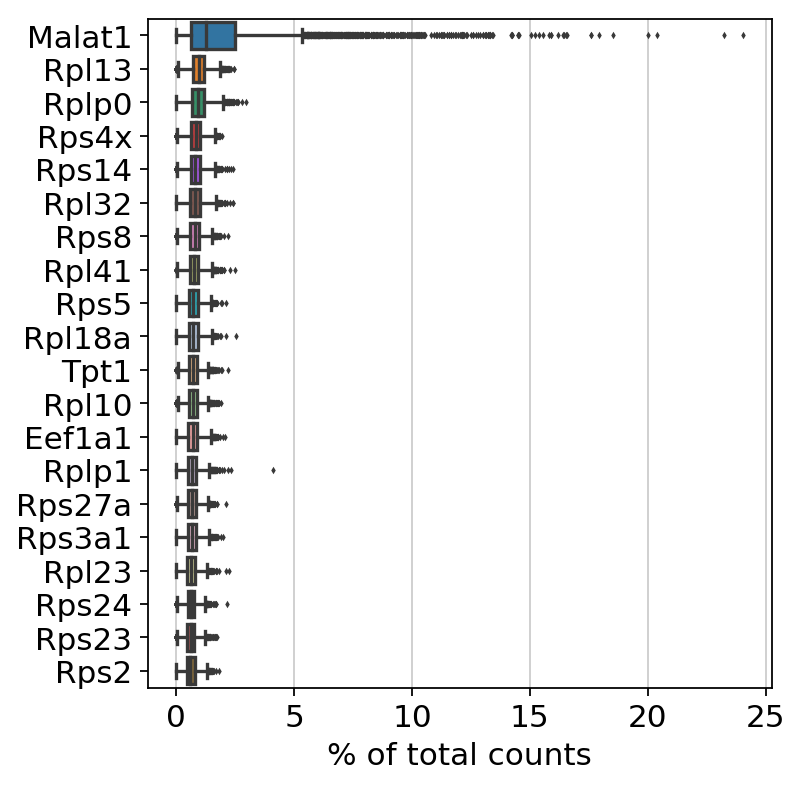

In [8]:
sc.pl.highest_expr_genes(adata, n_top=20)

In [9]:
sc.pp.filter_cells(adata, min_genes=200) # Basic filtering for removing genes that are expressing in less than 3 cells
sc.pp.filter_genes(adata, min_cells=3)

filtered out 43 cells that haveless than 200 genes expressed
filtered out 13773 genes that are detectedin less than 3 cells


In [10]:
mito_genes = adata.var_names.str.startswith('mt') # 'mt' here is lower case, because it's mice. in the tutorial is 'MT' because of human dataset. ifor each cell compute fraction of counts in mito genes vs. all genes
adata.obs['percent_mito'] = np.sum(
    adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1 # the `.A1` is only necessary as X is sparse (to transform to a dense array after summing) puts the percentages of each cell into an array instead of an individual sparse
adata.obs['n_counts'] = adata.X.sum(axis=1).A1 # add the total counts per cell as observations-annotation (metadata) to adata.

... storing 'Chromosome' as categorical
... storing 'Strand' as categorical


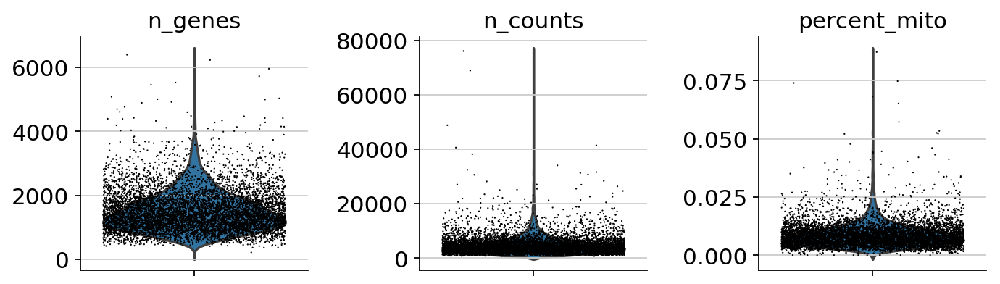

In [11]:
sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
             jitter=0.4, multi_panel=True)

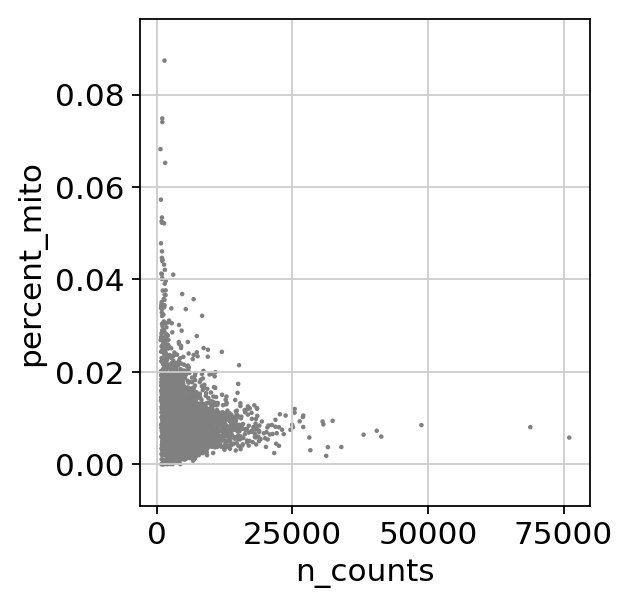

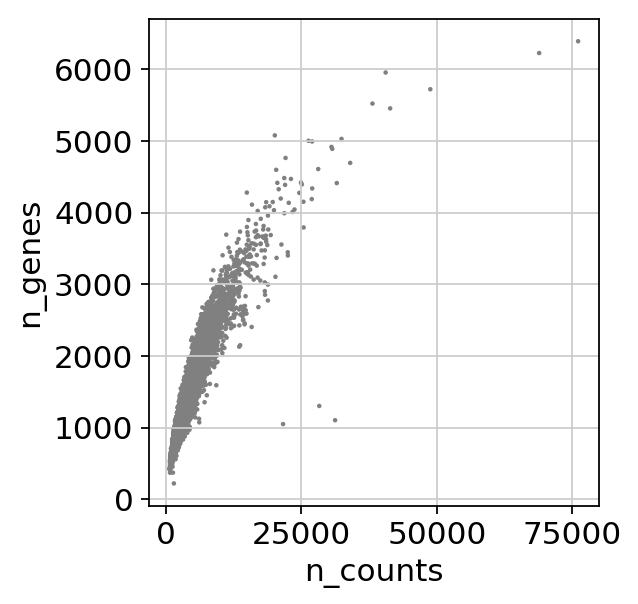

In [12]:
sc.pl.scatter(adata, x='n_counts', y='percent_mito')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [13]:
adata = adata[adata.obs.n_genes < 6000, :]
adata = adata[adata.obs.percent_mito < 0.05, :]

In [14]:
sc.pp.normalize_total(adata, target_sum = None) # n_Count cell normalization. Makes it so that the gene expression in each cell doesn't overpower the expression of lesser expressed genes
# if target_sum = None then the medium of n_counts/reads per cell is assigned to all cells to have counts comparable among all cells 

Normalizing counts per cell.
    finished (0:00:00):normalized adata.X


In [15]:
sc.pp.log1p(adata)

/home/driskelllab/anaconda3/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:285: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(data)


In [16]:
sc.pp.highly_variable_genes(adata, n_top_genes=2000) # Identifying highly variable genes

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


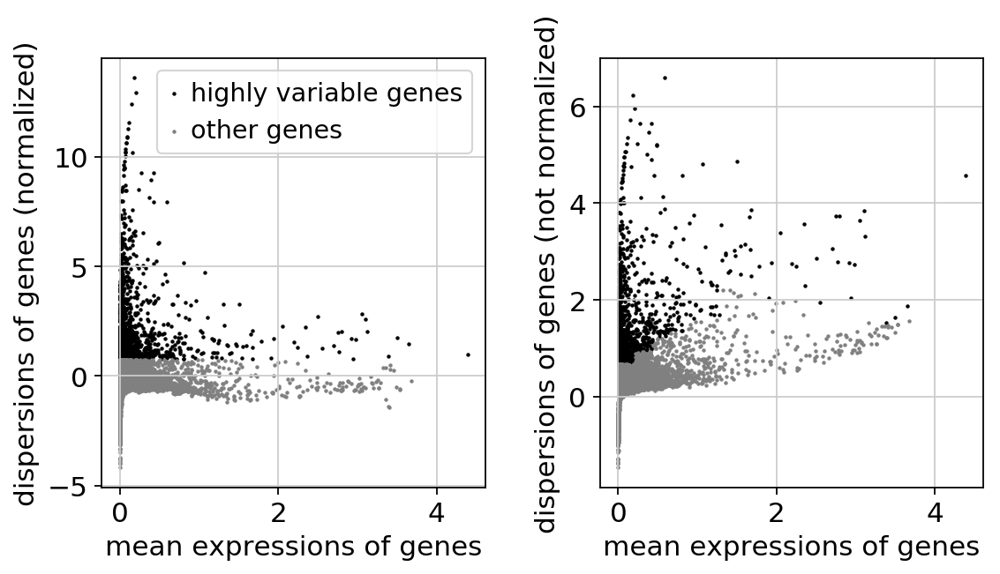

In [17]:
sc.pl.highly_variable_genes(adata)

In [18]:
sc.pp.regress_out(adata, ['n_counts', 'percent_mito']) # Regressing out total counts per cell and percent.mt before scaling

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:01:43)


In [19]:
sc.pp.scale(adata, max_value=10) # Scaling, takes all your genes and makes sure that they do not overpower other genes in all cells.

In [20]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:01)


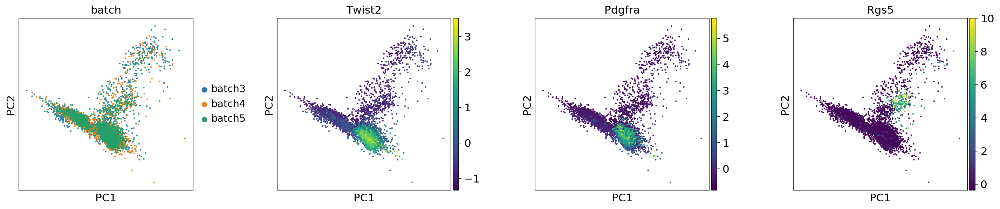

In [21]:
sc.pl.pca(adata, color=['batch', 'Twist2', 'Pdgfra', 'Rgs5'], wspace=0.35) # color literally means color a gene

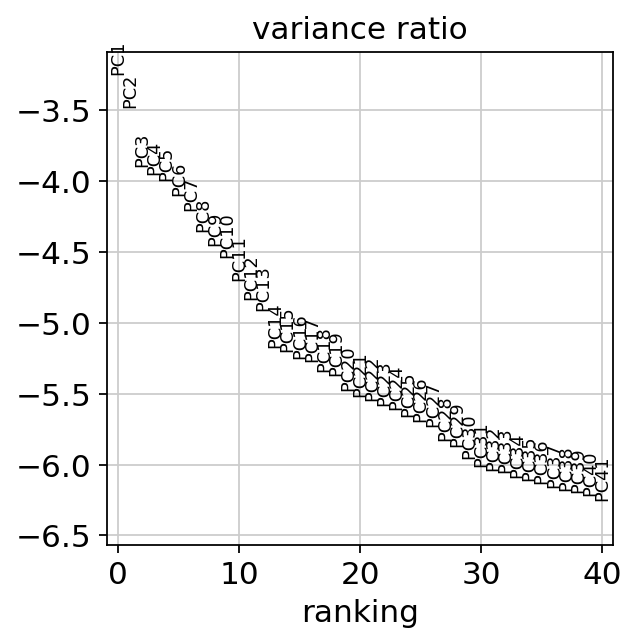

In [22]:
sc.pl.pca_variance_ratio(adata, n_pcs=40, log=True)

In [23]:
adata

AnnData object with n_obs × n_vars = 7221 × 17272 
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'batch_colors'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [24]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=37)

computing neighbors
    using 'X_pca' with n_pcs = 37
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:02)


In [25]:
sc.tl.umap(adata)

computing UMAP


/home/driskelllab/anaconda3/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:15)


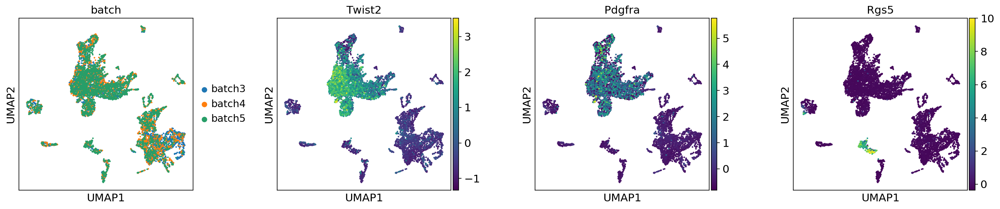

In [26]:
sc.pl.umap(adata, color=['batch', 'Twist2', 'Pdgfra', 'Rgs5'], wspace=0.35)

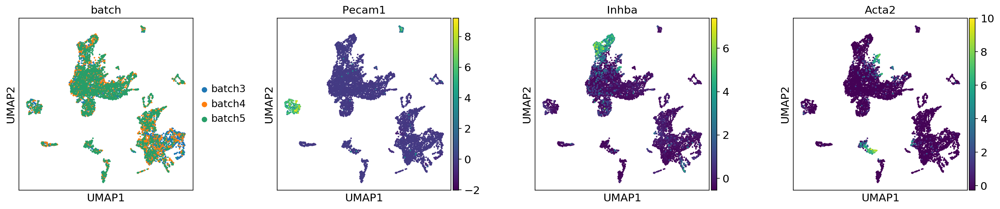

In [27]:
sc.pl.umap(adata, color=['batch', 'Pecam1','Inhba','Acta2'], use_raw=False, wspace=0.35)

In [28]:
sc.tl.louvain(adata, resolution=0.8) # Clustering/Neighbors

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 25 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


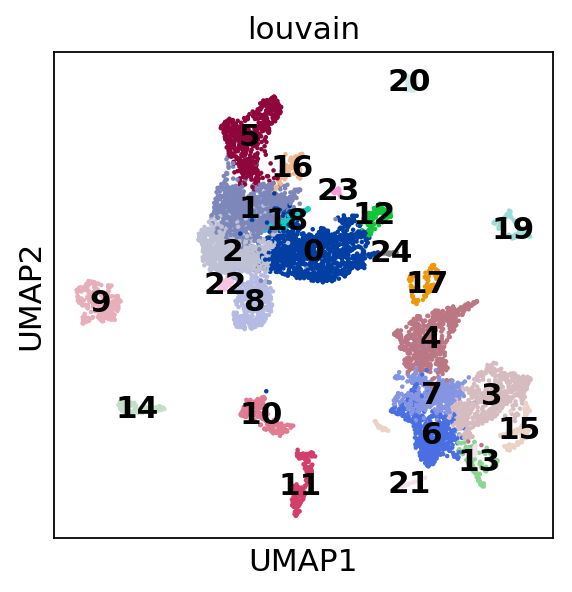

In [29]:
sc.pl.umap(adata, color=['louvain'], legend_loc='on data')

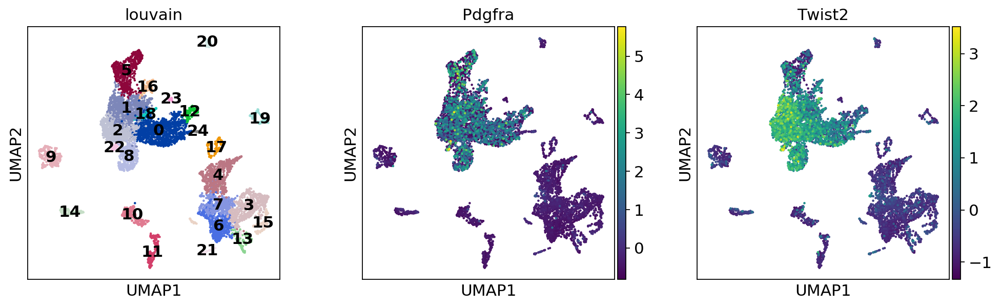

In [30]:
sc.pl.umap(adata, color=['louvain', 'Pdgfra', 'Twist2'], legend_loc='on data')

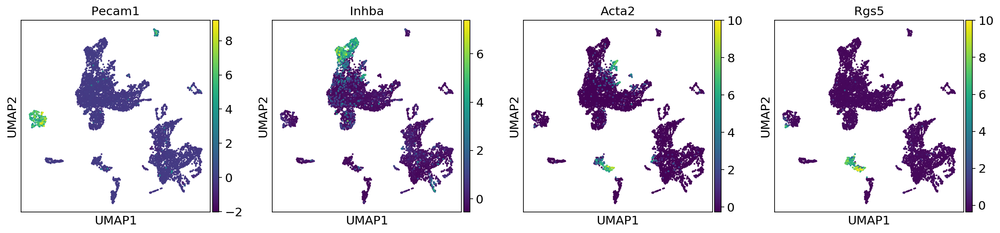

In [31]:
sc.pl.umap(adata, color=['Pecam1','Inhba','Acta2','Rgs5'])

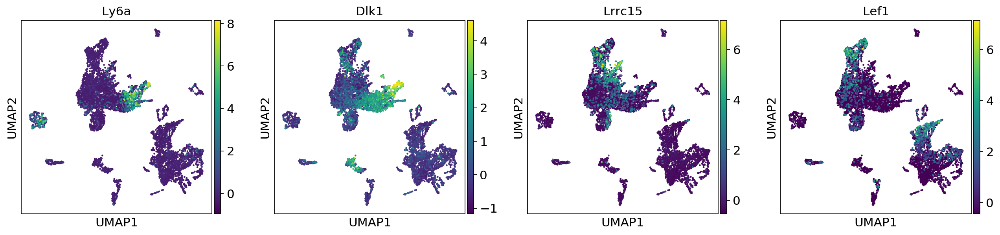

In [32]:
sc.pl.umap(adata, color=['Ly6a','Dlk1','Lrrc15','Lef1'])

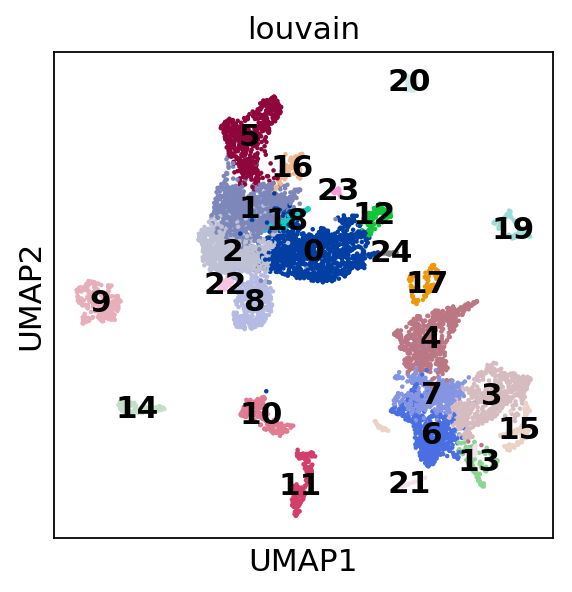

In [33]:
sc.pl.umap(adata, color=['louvain'], legend_loc='on data')

In [34]:
#####SUBSETTING AREA######

In [35]:
adata_subset = adata[adata.obs['louvain'].isin(
    ['0','24','12','8','22','2','1','18','16','5'])]

In [36]:
adata_subset

View of AnnData object with n_obs × n_vars = 3932 × 17272 
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'louvain'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'batch_colors', 'neighbors', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [37]:
sc.tl.pca(adata_subset, svd_solver='arpack')

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)


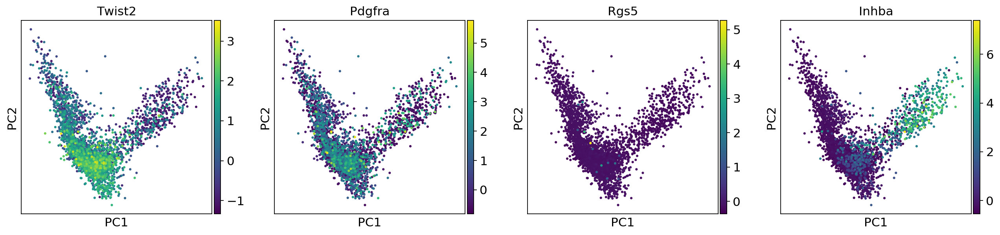

In [38]:
sc.pl.pca(adata_subset, color=['Twist2', 'Pdgfra', 'Rgs5','Inhba'])

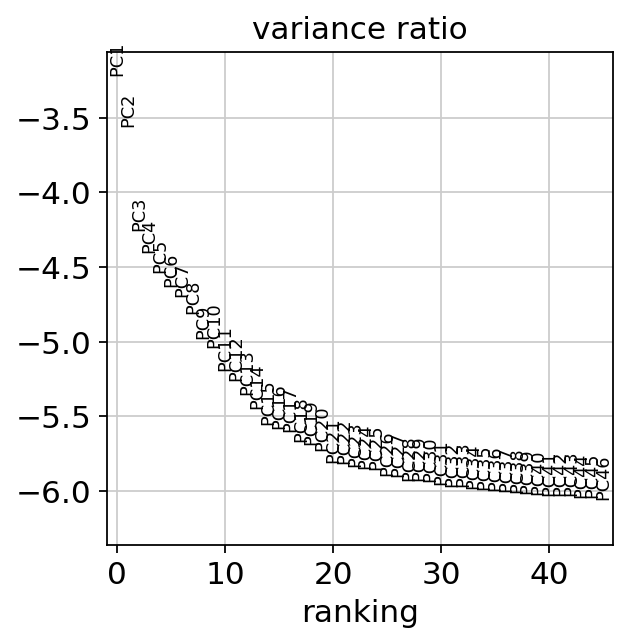

In [39]:
sc.pl.pca_variance_ratio(adata_subset, n_pcs=45, log=True)

In [40]:
sc.tl.umap(adata_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [41]:
sc.tl.louvain(adata_subset, resolution=0.44)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


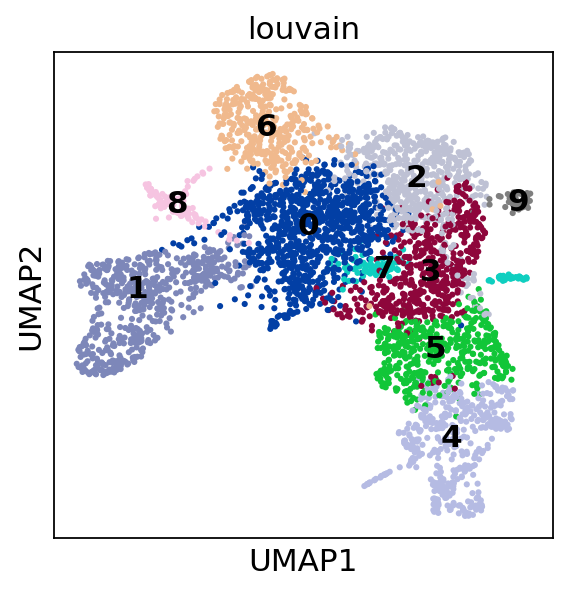

In [42]:
sc.pl.umap(adata_subset, color=['louvain'], legend_loc='on data')

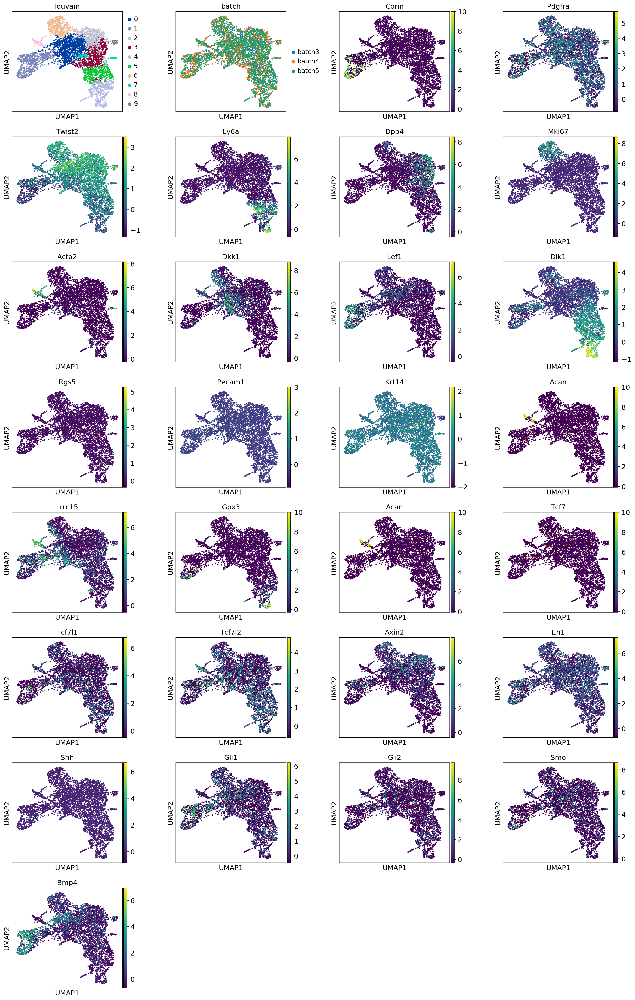

In [43]:
sc.pl.umap(adata_subset, color=['louvain','batch','Corin','Pdgfra','Twist2','Ly6a','Dpp4','Mki67','Acta2','Dkk1',
                               'Lef1','Dlk1','Rgs5','Pecam1','Krt14','Acan','Lrrc15','Gpx3','Acan',
                               'Tcf7','Tcf7l1','Tcf7l2','Axin2','En1','Shh','Gli1','Gli2','Smo',
                               'Bmp4'], 
           wspace=0.35,
          color_map='viridis')

In [44]:
new_cluster_names = [
    '0 Dkk1',
'1 DP', 
'2 Dpp4',
'3 Retic1',
'4 Fascia',
'5 Hypo',
'6 Pap Div',
'7 AP',
    '8 DS',
    '9 Retic3'
]
adata_subset.rename_categories('louvain', new_cluster_names)

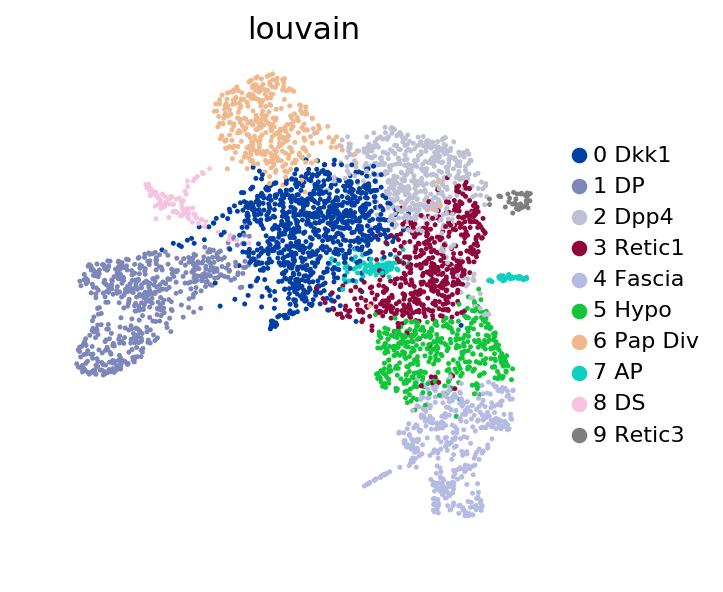

In [45]:
sc.pl.umap(adata_subset, color='louvain', legend_loc='right margin', legend_fontsize='10.0', size=20,
           frameon=False)

In [46]:
adata_subset_nodiv = adata_subset[adata_subset.obs['louvain'].isin(['0', '1', '2', '3', '5', '6', '7','8','9'])]

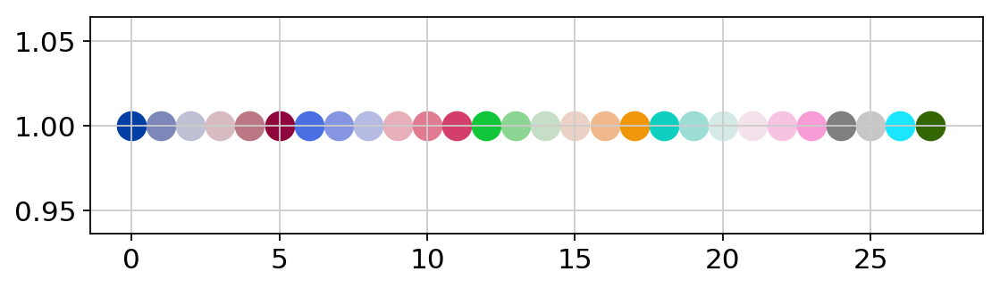

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as pl
from matplotlib import rcParams
import scanpy as sc
pl.figure(figsize=(8, 2))
for i in range(28):
    pl.scatter(i, 1, c=sc.pl.palettes.zeileis_26[i], s=200)
pl.show()

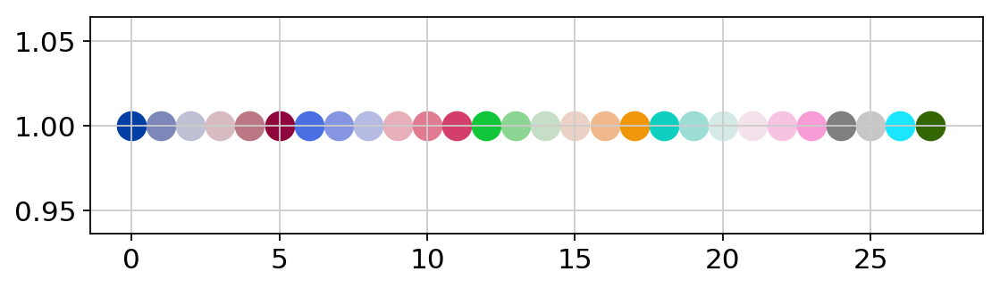

In [48]:
pl.figure(figsize=(8, 2))
for i in range(28):
    pl.scatter(i, 1, c=sc.pl.palettes.zeileis_26[i], s=200)
pl.show()

In [49]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_26)
new_colors = np.array(adata_subset.uns['louvain_colors'])

In [51]:
#new_colors[[11, 3]] = zeileis_colors[[12, 27]]  # DP / green
new_colors[[0]] = zeileis_colors[[0]]  # 0 Dkk1
new_colors[[1]] = zeileis_colors[[12]]  # 1 DP
new_colors[[2]] = zeileis_colors[[25]]  # 2 DPP4
new_colors[[3]] = zeileis_colors[[5]]  # 3 Retic1
new_colors[[4]] = zeileis_colors[[8]]   # 4 Fascia 
new_colors[[5]] = zeileis_colors[[6]]  # 5 Hypo
new_colors[[6]] = zeileis_colors[[16]]  # 6 Div
new_colors[[7]] = zeileis_colors[[26]]  # 7 AP
new_colors[[8]] = zeileis_colors[[24]]  # 8 DS
new_colors[[9]] = zeileis_colors[[5]]  # 9 Retic2

In [52]:
adata_subset.uns['louvain_colors'] = new_colors

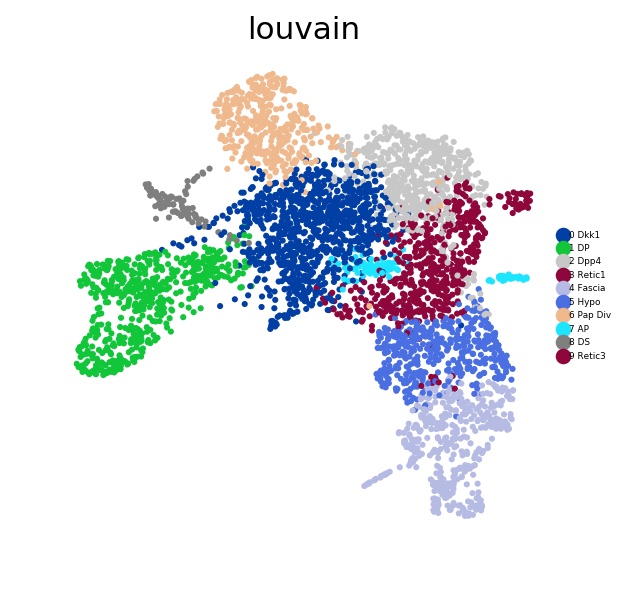

In [53]:
sc.pl.umap(adata_subset, color='louvain', legend_loc='right margin', legend_fontsize='4.0',
           frameon=False)

In [54]:
from IPython.core.display import display, HTML # Switching tutorials over to RNA Velocity (scVelo)
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import scvelo as scv
scv.logging.print_version()

Running scvelo 0.1.25.dev11+gb64c2f7 (python 3.7.4) on 2020-04-07 09:48.


In [55]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params('scvelo')  # for beautified visualization

In [56]:
#scv.pp.filter_genes(bdata, min_shared_counts=10)
#scv.pp.normalize_per_cell(bdata)
#scv.pp.filter_genes_dispersion(bdata, n_top_genes=3000)
#scv.pp.log1p(bdata)

In [57]:
scv.pp.filter_and_normalize(adata_subset, min_shared_counts=30, n_top_genes=2000)
scv.pp.moments(adata_subset, n_pcs=30, n_neighbors=30)

Filtered out 12239 genes that are detected in less than 30 counts (shared).
Normalized count data: spliced, unspliced.
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
computing neighbors
    finished (0:00:00) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of spliced/unspliced abundances (adata.layers)


In [58]:
adata_subset

AnnData object with n_obs × n_vars = 3932 × 2000 
    obs: 'Clusters', '_X', '_Y', 'batch', 'n_genes', 'percent_mito', 'n_counts', 'louvain', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'pca', 'batch_colors', 'neighbors', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'Ms', 'Mu'

In [59]:
scv.tl.velocity(adata_subset)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [60]:
scv.tl.velocity_graph(adata_subset)

computing velocity graph
    finished (0:00:07) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


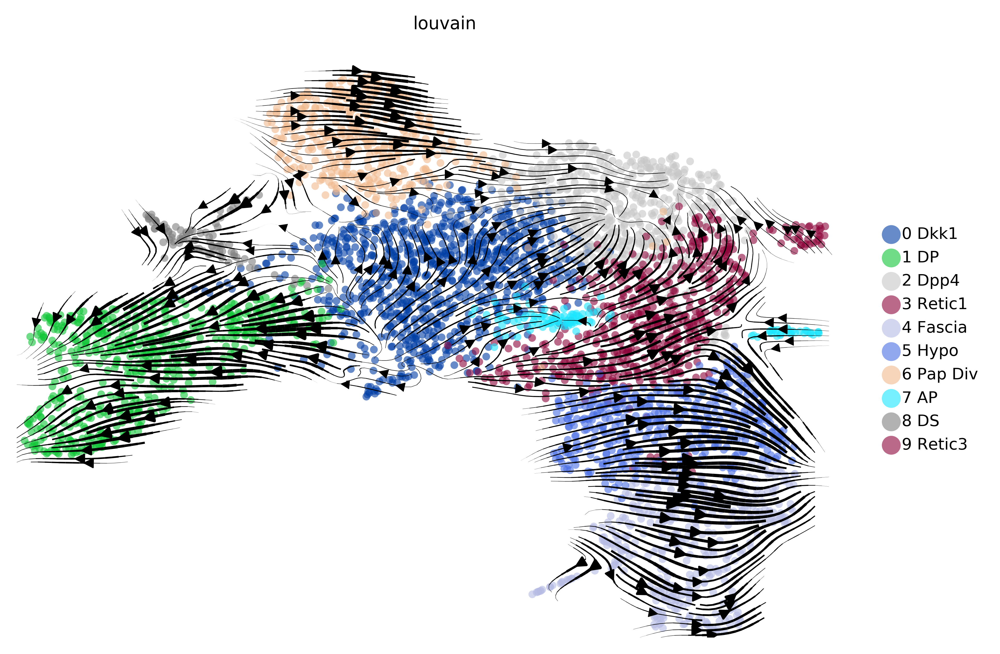

In [61]:
scv.pl.velocity_embedding_stream(adata_subset, basis='umap', 
                                 color=['louvain'], 
                                 frameon=None, 
                                 legend_loc='right margin',
                                density=2,
                                size=50,
                                 n_neighbors=None,
                                 groups=None,
                                 alpha=0.6,
                                dpi=300)

In [62]:
scv.tl.rank_velocity_genes(adata_subset, match_with='louvain', n_genes=1000)

import pandas as pd
pd.DataFrame(adata_subset.uns['rank_velocity_genes']['names']).head(50000)

computing velocity clusters
    finished (0:00:00) --> added 
    'velocity_clusters', clusters based on modularity on velocity field (adata.obs)
ranking velocity genes
    finished (0:00:00) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns)


,6 Pap Div 0,0 Dkk1 1,1 DP 2,5 Hypo 3,2 Dpp4 4,0 Dkk1 5,2 Dpp4 6,5 Hypo 7,3 Retic1 8,8 DS 9,4 Fascia 10,1 DP 11,4 Fascia 12,7 AP 13,4 Fascia 14
0,Trps1,Pitx2,Lamc3,Bgn,Cdh6,Mef2c,Tiparp,Tnfaip6,Cdh6,Adamts18,Gfra1,Kif26b,Slc4a4,Itga8,Adam12
1,Lef1,Trim36,Sobp,Rgs7bp,Ccdc141,Lef1,Trim36,Pcsk5,Ccdc141,Stmn2,Tnfaip6,Zfp423,Svil,Tmtc2,Epha3
2,Cenpk,Rgs10,Prdm1,Vcan,Mef2c,Trps1,Tacc2,Sntb2,Tiparp,Kif26b,Pde10a,Gfra1,Lpl,Smoc2,Postn
3,Prr11,Stxbp6,Ebf4,Mmp2,Col12a1,Pitx2,Tanc2,Klf9,Zfp536,Frem1,Ltbp1,Sobp,Thbs2,Ppp1r1a,Nrk
4,Mef2c,Adamts2,Gfra1,Tcf7l2,Trim36,Nrn1,Gria3,Svil,Fam171b,Flrt2,Ghr,Col26a1,Pcsk5,Plxna4,Meox2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Clcn5,Rgs6,Zfp536,Ubash3b,Kif26b,Bgn,Cblb,Tns3,Cblb,Hmcn1,Serping1,Heyl,Tnxb,Maf,Zfp536
191,Rgs6,Tnfaip6,Tnfaip6,Sobp,Zfp423,Pappa2,Zfp423,Ednra,Gfra1,Trim36,Mef2c,Tacc2,Lef1,Tacc2,Lrfn5
192,Tnfaip6,Cacna2d1,Col12a1,Serping1,Gfra1,Rgs6,Gfra1,Trps1,Kif26b,Cdh6,Ednra,Col12a1,Tcf7l2,Svil,Trps1
193,Cacna2d1,Rgs7bp,Plxna4,Thbs2,Ltbp1,Cacna2d1,Rgs6,Mef2c,Ltbp1,Zfp536,Trps1,Tiparp,Mef2c,Rgs7bp,Plxna4


In [168]:
#p2velocitydata = pd.DataFrame(adata_subset.uns['rank_velocity_genes']['names'])

In [169]:
#p2velocitydata.to_csv('/home/driskelllab/Desktop/p2fibroblastvelodata.csv')  #Don't forget to add '.csv' at the end of the path

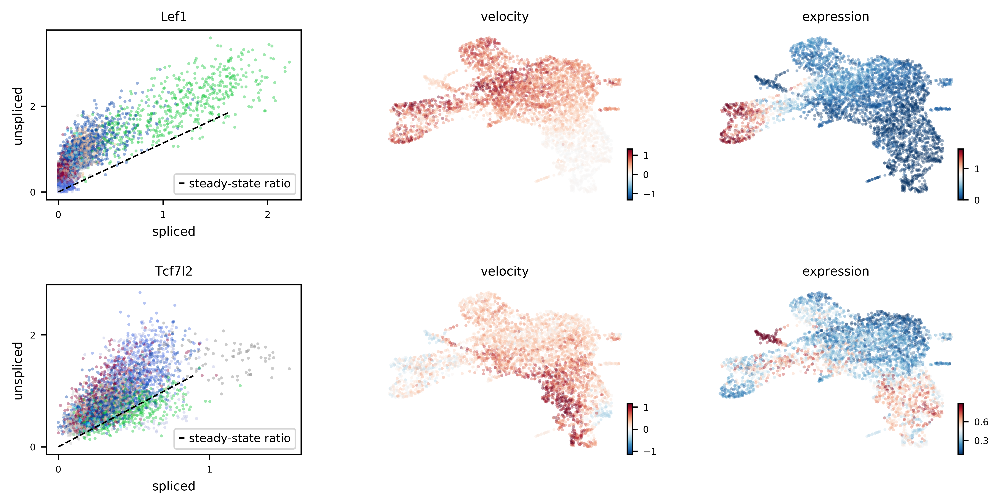

In [63]:
var_names = ['Lef1','Tcf7l2'] 
scv.pl.velocity(adata_subset, var_names=var_names, 
                colorbar=True, basis='umap', 
                ncols=None,
               color_map='RdBu_r',
               size=15,
               alpha=0.4,
                dpi=300
               )